In [1]:
import pandas as pd
import numpy as np
from scipy import stats
import requests

In [2]:
dataset1_file_ids = [
    '1ih1bIQZq06SYXow20Ai-Dxf_eG6ivjKe',
    '1gRMozSy7dkhcW0OZ-pcRnT48dSty3cHi',
    '1TWy11Gn-j1-WtshEe7ANE8onQZltTx-W',
    '11WCwQRnpZsA49OKsSJfgC1zXrR-axKCK'
]

dataset2_file_ids = [
    '16RV_xEVy--k5NrDXVm5zuUV9hqyz3yNQ',
    '1dS5F31ULWFgzBEUl2NMa7bFBhs18ZpCk',
    '1be0E-FKQGamhwIN9sC1xGajPWaiwzsz_',
    '1Au0CiYmiH-bkIBjznFUuzlXZssX56R7N'
]

file_names = [
    'googleads-performance.csv',
    'metaads-performance.csv',
    'microsoftads-performance.csv',
    'website-landings.csv'
]

In [3]:
!pip install gdown

In [4]:
import gdown

In [5]:
def download_file_from_google_drive(file_id, dest_path):
    url = f'https://drive.google.com/uc?export=download&id={file_id}'
    gdown.download(url, dest_path, quiet=False)
for file_id, file_name in zip(dataset1_file_ids, file_names):
    download_file_from_google_drive(file_id, f'dataset1_{file_name}')
for file_id, file_name in zip(dataset2_file_ids, file_names):
    download_file_from_google_drive(file_id, f'dataset2_{file_name}')

Downloading...
From: https://drive.google.com/uc?export=download&id=1ih1bIQZq06SYXow20Ai-Dxf_eG6ivjKe
To: /content/dataset1_googleads-performance.csv
100%|██████████| 37.8k/37.8k [00:00<00:00, 28.3MB/s]
Downloading...
From: https://drive.google.com/uc?export=download&id=1gRMozSy7dkhcW0OZ-pcRnT48dSty3cHi
To: /content/dataset1_metaads-performance.csv
100%|██████████| 8.98k/8.98k [00:00<00:00, 11.2MB/s]
Downloading...
From: https://drive.google.com/uc?export=download&id=1TWy11Gn-j1-WtshEe7ANE8onQZltTx-W
To: /content/dataset1_microsoftads-performance.csv
100%|██████████| 37.5k/37.5k [00:00<00:00, 43.1MB/s]
Downloading...
From: https://drive.google.com/uc?export=download&id=11WCwQRnpZsA49OKsSJfgC1zXrR-axKCK
To: /content/dataset1_website-landings.csv
100%|██████████| 77.9M/77.9M [00:01<00:00, 46.5MB/s]
Downloading...
From: https://drive.google.com/uc?export=download&id=16RV_xEVy--k5NrDXVm5zuUV9hqyz3yNQ
To: /content/dataset2_googleads-performance.csv
100%|██████████| 27.5k/27.5k [00:00<00:00,

In [6]:
googleads_files = ['dataset1_googleads-performance.csv', 'dataset2_googleads-performance.csv']
metaads_files = ['dataset1_metaads-performance.csv', 'dataset2_metaads-performance.csv']
microsoftads_files = ['dataset1_microsoftads-performance.csv', 'dataset2_microsoftads-performance.csv']
website_landings_files = ['dataset1_website-landings.csv', 'dataset2_website-landings.csv']
def load_and_combine(files):
    dfs = [pd.read_csv(file) for file in files]
    combined_df = pd.concat(dfs, ignore_index=True)
    return combined_df

In [7]:
df1 = load_and_combine(googleads_files)
df2 = load_and_combine(metaads_files)
df3 = load_and_combine(microsoftads_files)
df4 = load_and_combine(website_landings_files)

In [8]:
df1.head()


,Date,Campaign type,Impressions,Clicks,Cost,Conversions,Revenue
0,2024-01-01,Cross-network,143669.0,896.0,656.3,6.5,1410.3
1,2024-01-01,Display Network,3.0,0.0,0.0,0.0,0.0
2,2024-01-01,Search Network,3701.0,251.0,496.5,4.5,576.4
3,2024-01-01,YouTube,36211.0,8.0,115.2,0.0,0.0
4,2024-01-02,Cross-network,183496.0,1172.0,1525.0,8.8,3565.7


In [9]:
df2.head()


,Date,Impressions,Reach,Cost,Clicks,Conversions,Revenue
0,2024-01-01,36034.0,27263.0,209.1,608.0,4.0,158.2
1,2024-01-02,30804.0,22648.0,204.9,516.0,11.0,1412.8
2,2024-01-03,26372.0,18947.0,198.7,429.0,4.0,371.5
3,2024-01-04,17354.0,11436.0,131.2,324.0,4.0,0.0
4,2024-01-05,12036.0,7921.0,114.0,224.0,2.0,0.0


In [10]:
df3.head()


,Date,Campaign type,Impressions,Clicks,Cost,Conversions,Revenue
0,2024-01-01,Audience,9132.0,50.0,26.8,0.0,0.0
1,2024-01-01,Performance max,897.0,9.0,7.0,0.0,0.0
2,2024-01-01,Search & content,95977.0,561.0,846.5,1.0,168.8
3,2024-01-01,Shopping,59860.0,343.0,215.2,1.0,143.5
4,2024-01-02,Audience,9926.0,49.0,25.9,0.0,0.0


In [11]:
df4.head()


,User Id,Website Landing Time,Is Converted,Source,Channel,Campaign Type
0,20a70111,2024-02-29 01:57:19,0,NaN,direct,NaN
1,20a70111,2024-02-29 13:58:10,0,NaN,direct,NaN
2,58830f30,2024-01-18 13:22:58,0,NaN,direct,NaN
3,58830f30,2024-01-19 16:19:37,0,NaN,direct,NaN
4,58830f30,2024-01-22 13:33:16,0,NaN,direct,NaN


In [12]:

def dataframe_summary(df, name):
    print(f"Summary for {name}:")
    print(f"Number of rows: {df.shape[0]}")
    print(f"Number of columns: {df.shape[1]}")
    print("Missing values:")
    print(df.isnull().sum())
    print("Data types:")
    print(df.dtypes)
    print("\n")
dataframe_summary(df1, 'Google Ads Performance')
dataframe_summary(df2, 'Meta Ads Performance')
dataframe_summary(df3, 'Microsoft Ads Performance')
dataframe_summary(df4, 'Website Landings')

Summary for Google Ads Performance:
Number of rows: 1184
Number of columns: 7
Missing values:
Date             0
Campaign type    0
Impressions      0
Clicks           0
Cost             0
Conversions      0
Revenue          0
dtype: int64
Data types:
Date              object
Campaign type     object
Impressions      float64
Clicks           float64
Cost             float64
Conversions      float64
Revenue          float64
dtype: object


Summary for Meta Ads Performance:
Number of rows: 364
Number of columns: 7
Missing values:
Date           0
Impressions    0
Reach          0
Cost           0
Clicks         0
Conversions    0
Revenue        0
dtype: int64
Data types:
Date            object
Impressions    float64
Reach          float64
Cost           float64
Clicks         float64
Conversions    float64
Revenue        float64
dtype: object


Summary for Microsoft Ads Performance:
Number of rows: 1085
Number of columns: 7
Missing values:
Date             0
Campaign type    0
Impression

In [13]:

df4 = df4.dropna()
dataframe_summary(df4, 'Website Landings - Cleaned')

Summary for Website Landings - Cleaned:
Number of rows: 1302349
Number of columns: 6
Missing values:
User Id                 0
Website Landing Time    0
Is Converted            0
Source                  0
Channel                 0
Campaign Type           0
dtype: int64
Data types:
User Id                 object
Website Landing Time    object
Is Converted             int64
Source                  object
Channel                 object
Campaign Type           object
dtype: object




In [14]:
def convert_data_types(df):
    if 'Date' in df.columns:
        df['Date'] = pd.to_datetime(df['Date'])
    if 'Website Landing Time' in df.columns:
        df['Website Landing Time'] = pd.to_datetime(df4['Website Landing Time'])
    if 'Impressions' in df.columns:
        df['Impressions'] = df['Impressions'].astype(int)
    if 'Clicks' in df.columns:
        df['Clicks'] = df['Clicks'].astype(int)
    if 'Reach' in df.columns:
        df['Reach'] = df['Reach'].astype(int)
    return df

In [15]:
df1 = convert_data_types(df1)
df2 = convert_data_types(df2)
df3 = convert_data_types(df3)
df4 = convert_data_types(df4)

In [16]:
def dataframe_summary(df, name):
    print(f"Summary for {name}:")
    print(f"Number of rows: {df.shape[0]}")
    print(f"Number of columns: {df.shape[1]}")
    print("Missing values:")
    print(df.isnull().sum())
    print("Data types:")
    print(df.dtypes)
    print("\n")
dataframe_summary(df1, 'Google Ads Performance')
dataframe_summary(df2, 'Meta Ads Performance')
dataframe_summary(df3, 'Microsoft Ads Performance')
dataframe_summary(df4, 'Website Landings')

Summary for Google Ads Performance:
Number of rows: 1184
Number of columns: 7
Missing values:
Date             0
Campaign type    0
Impressions      0
Clicks           0
Cost             0
Conversions      0
Revenue          0
dtype: int64
Data types:
Date             datetime64[ns]
Campaign type            object
Impressions               int64
Clicks                    int64
Cost                    float64
Conversions             float64
Revenue                 float64
dtype: object


Summary for Meta Ads Performance:
Number of rows: 364
Number of columns: 7
Missing values:
Date           0
Impressions    0
Reach          0
Cost           0
Clicks         0
Conversions    0
Revenue        0
dtype: int64
Data types:
Date           datetime64[ns]
Impressions             int64
Reach                   int64
Cost                  float64
Clicks                  int64
Conversions           float64
Revenue               float64
dtype: object


Summary for Microsoft Ads Performance:
Number o

In [17]:
def advanced_feature_engineering(df):
    if 'Clicks' in df.columns and 'Impressions' in df.columns:
        df['CTR'] = (df['Clicks'] / df['Impressions']).replace(np.inf, 0) * 100
    if 'Conversions' in df.columns and 'Clicks' in df.columns:
        df['Conversion Rate'] = (df['Conversions'] / df['Clicks']).replace(np.inf, 0) * 100
    if 'Cost' in df.columns and 'Clicks' in df.columns:
        df['CPC'] = (df['Cost'] / df['Clicks']).replace(np.inf, 0)
    if 'Revenue' in df.columns and 'Clicks' in df.columns:
        df['RPC'] = (df['Revenue'] / df['Clicks']).replace(np.inf, 0)
    if 'Cost' in df.columns and 'Conversions' in df.columns:
        df['CPA'] = (df['Cost'] / df['Conversions']).replace(np.inf, 0)
    if 'Revenue' in df.columns and 'Cost' in df.columns:
        df['ROAS'] = (df['Revenue'] / df['Cost']).replace(np.inf, 0)
    if 'Revenue' in df.columns and 'Conversions' in df.columns:
        df['Revenue Per Conversion'] = (df['Revenue'] / df['Conversions']).replace(np.inf, 0)
    if 'Impressions' in df.columns and 'Reach' in df.columns:
        df['Impressions Per Reach'] = (df['Impressions'] / df['Reach']).replace(np.inf, 0)
    if 'Clicks' in df.columns and 'Reach' in df.columns:
        df['Clicks Per Reach'] = (df['Clicks'] / df['Reach']).replace(np.inf, 0)
    df = df.dropna()

    return df
df1 = advanced_feature_engineering(df1)
df2 = advanced_feature_engineering(df2)
df3 = advanced_feature_engineering(df3)

In [18]:
def advanced_website_feature_engineering(df):
    df['Landing Year'] = df['Website Landing Time'].dt.year
    df['Landing Month'] = df['Website Landing Time'].dt.month
    df['Landing Day'] = df['Website Landing Time'].dt.day
    df['Landing Weekday'] = df['Website Landing Time'].dt.weekday
    df['Is Converted'] = df['Is Converted'].astype(int)
    return df

In [19]:
df4 = advanced_website_feature_engineering(df4)


In [20]:
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline

In [21]:
def advanced_eda(df, platform_name):
    def plot_distribution(df, columns):
        for column in columns:
            plt.figure(figsize=(10, 6))
            sns.histplot(df[column], bins=30, kde=True)
            plt.title(f'{platform_name} - Distribution of {column}')
            plt.xlabel(column)
            plt.ylabel('Frequency')
            plt.show()
    def plot_trends(df, date_column, metrics):
        for metric in metrics:
            plt.figure(figsize=(12, 8))
            df.groupby(date_column)[metric].sum().plot()
            plt.title(f'{platform_name} - {metric} Over Time')
            plt.xlabel('Date')
            plt.ylabel(metric)
            plt.show()
    def plot_correlation_matrix(df, title):
        plt.figure(figsize=(14, 12))
        corr_matrix = df.select_dtypes(include=[np.number]).corr()
        sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', fmt='.2f')
        plt.title(f'Correlation Matrix: {title}')
        plt.show()
    def plot_pairplot(df, columns):
        sns.pairplot(df[columns])
        plt.suptitle(f'{platform_name} - Pairplot of Key Metrics', y=1.02)
        plt.show()

    key_metrics = df.select_dtypes(include=[np.number]).columns.tolist()
    plot_distribution(df, key_metrics)
    plot_trends(df, 'Date', key_metrics)
    plot_correlation_matrix(df, f'{platform_name} Ads')
    plot_pairplot(df, key_metrics)


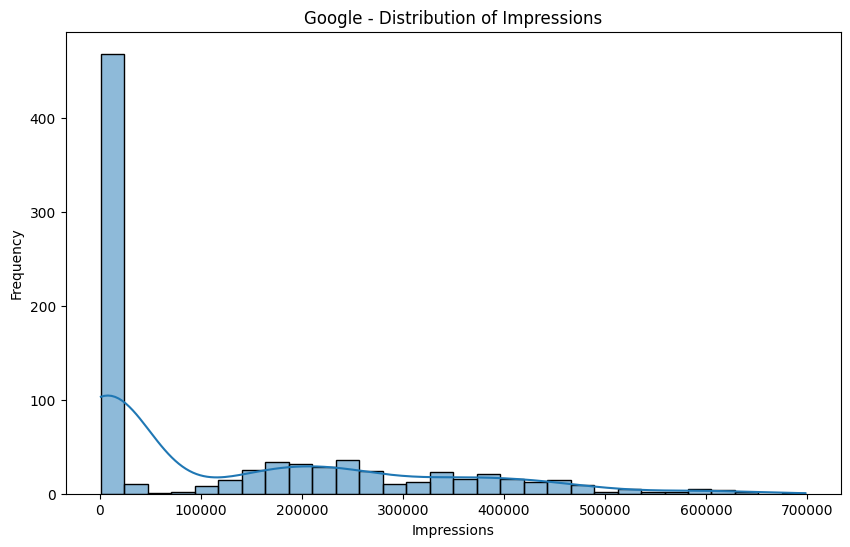

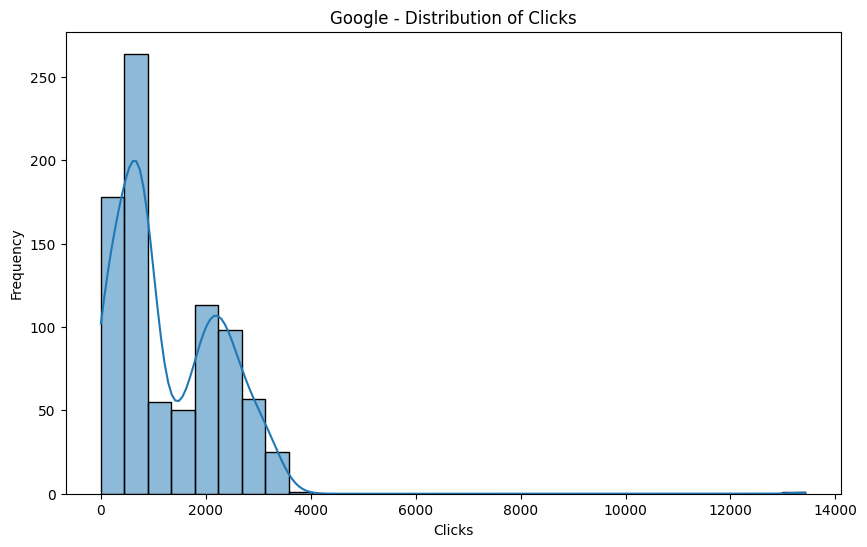

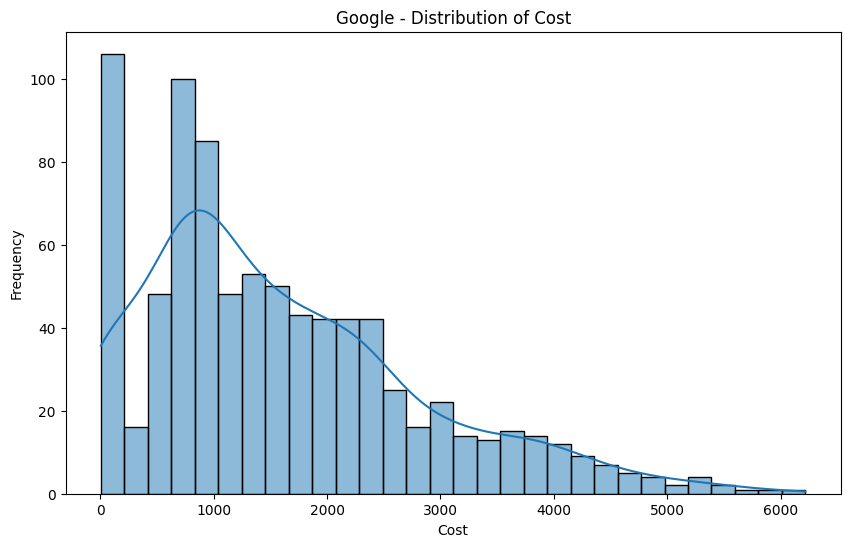

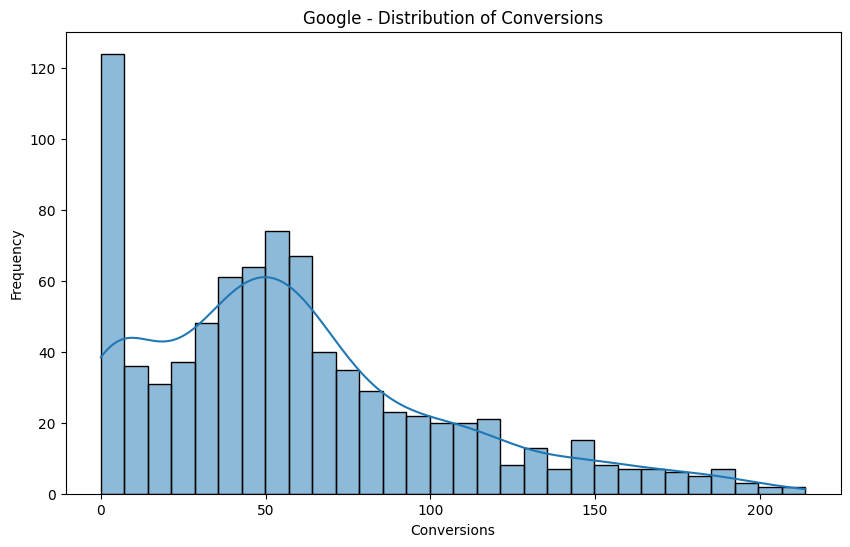

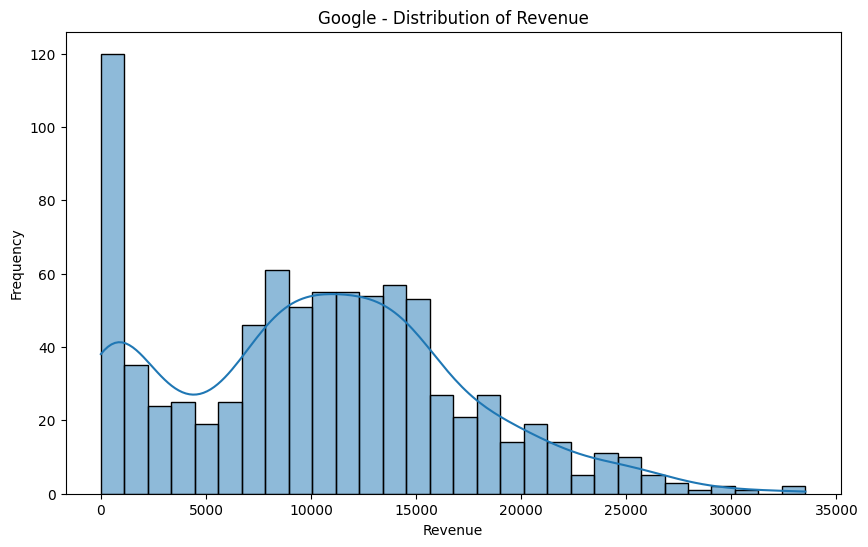

...

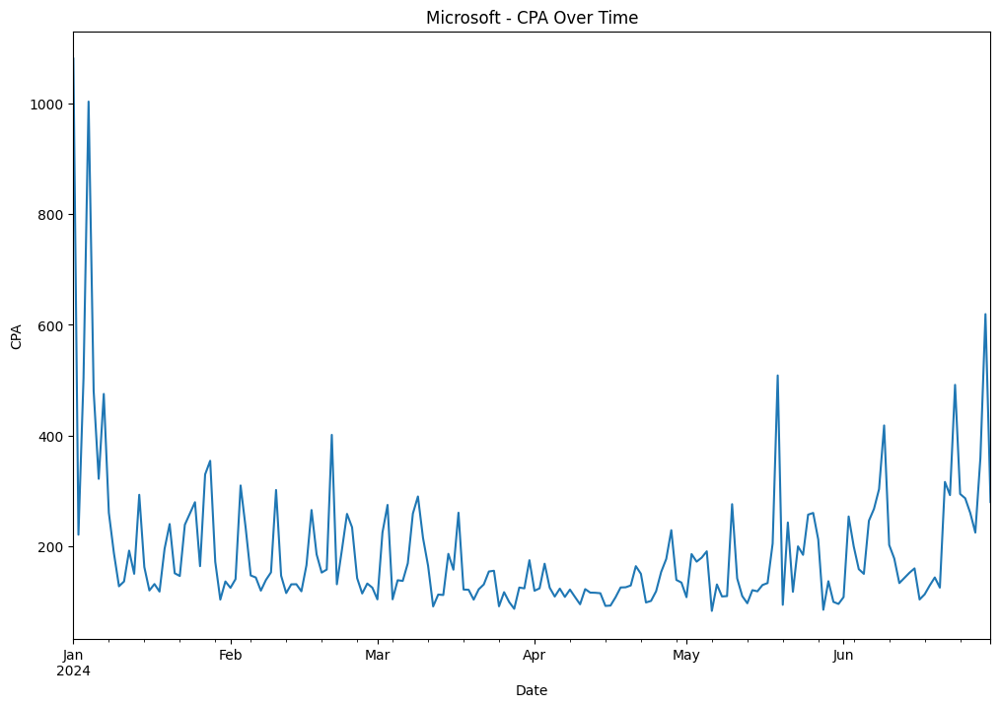

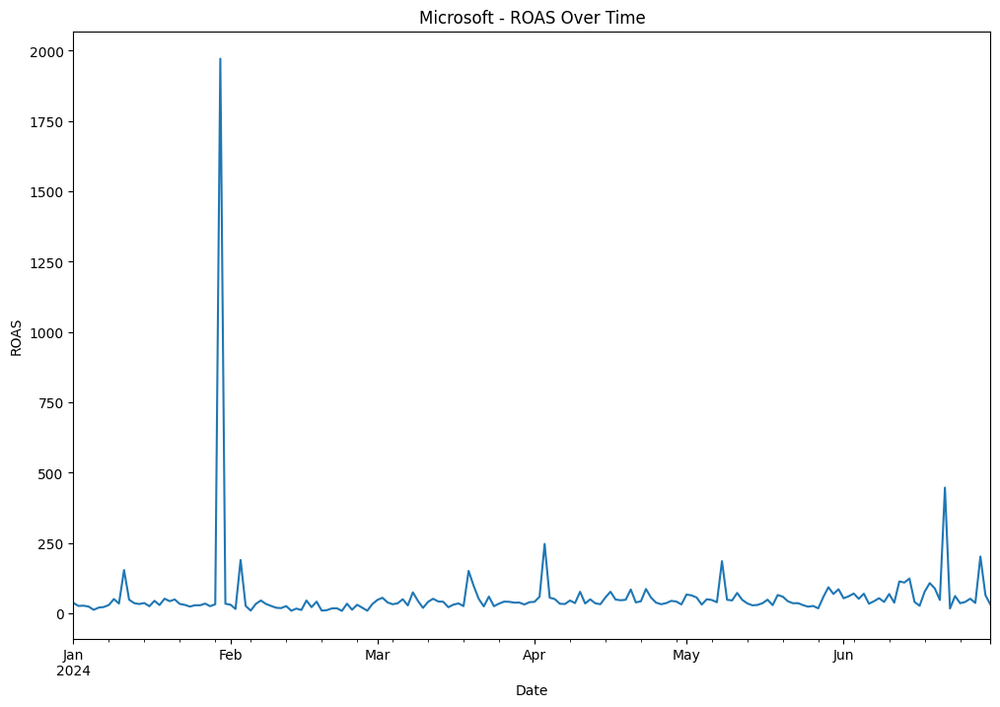

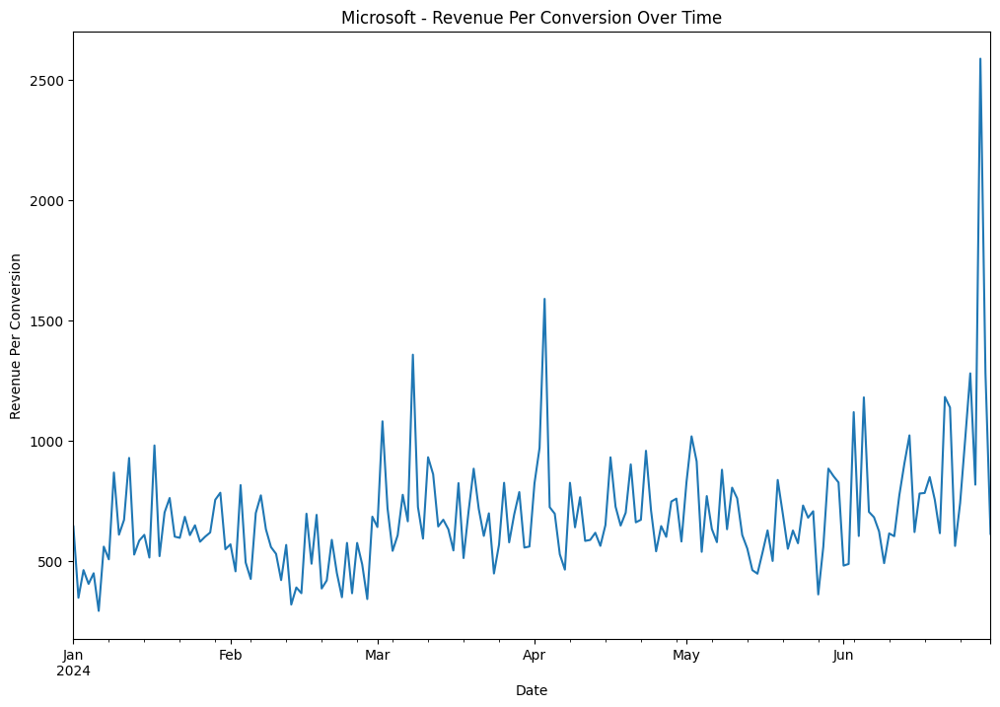

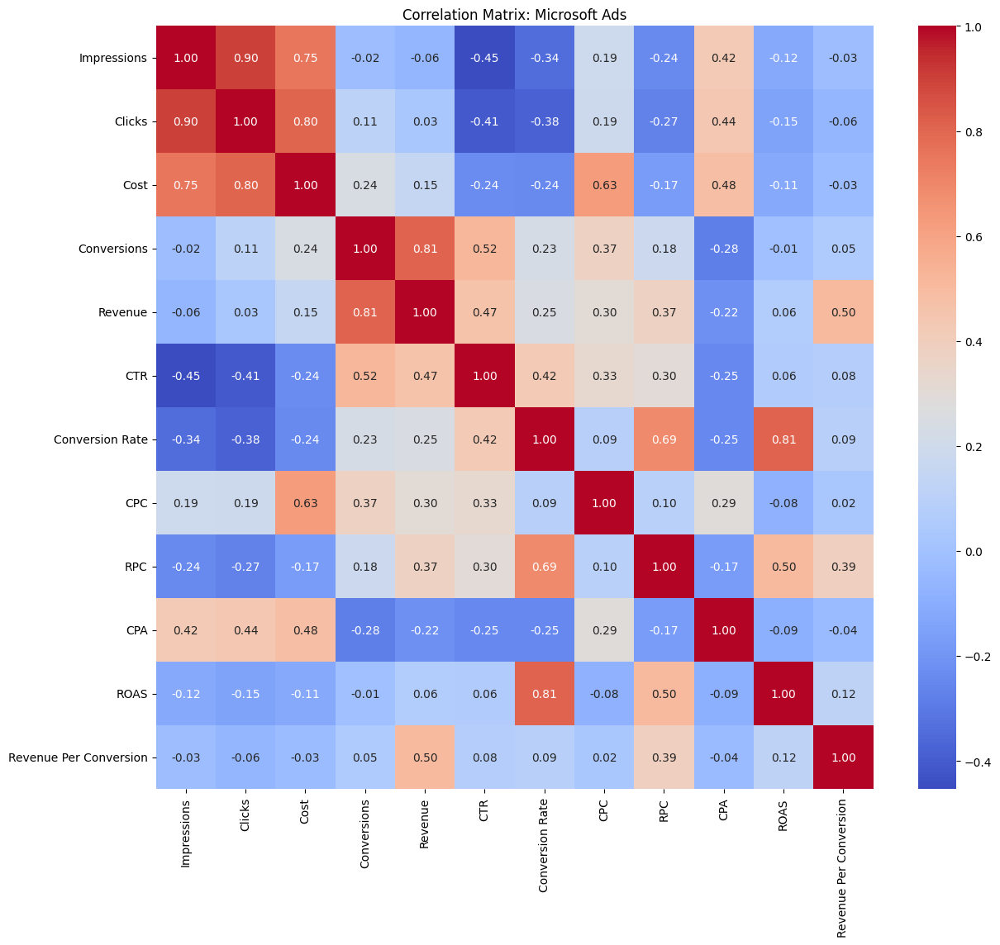

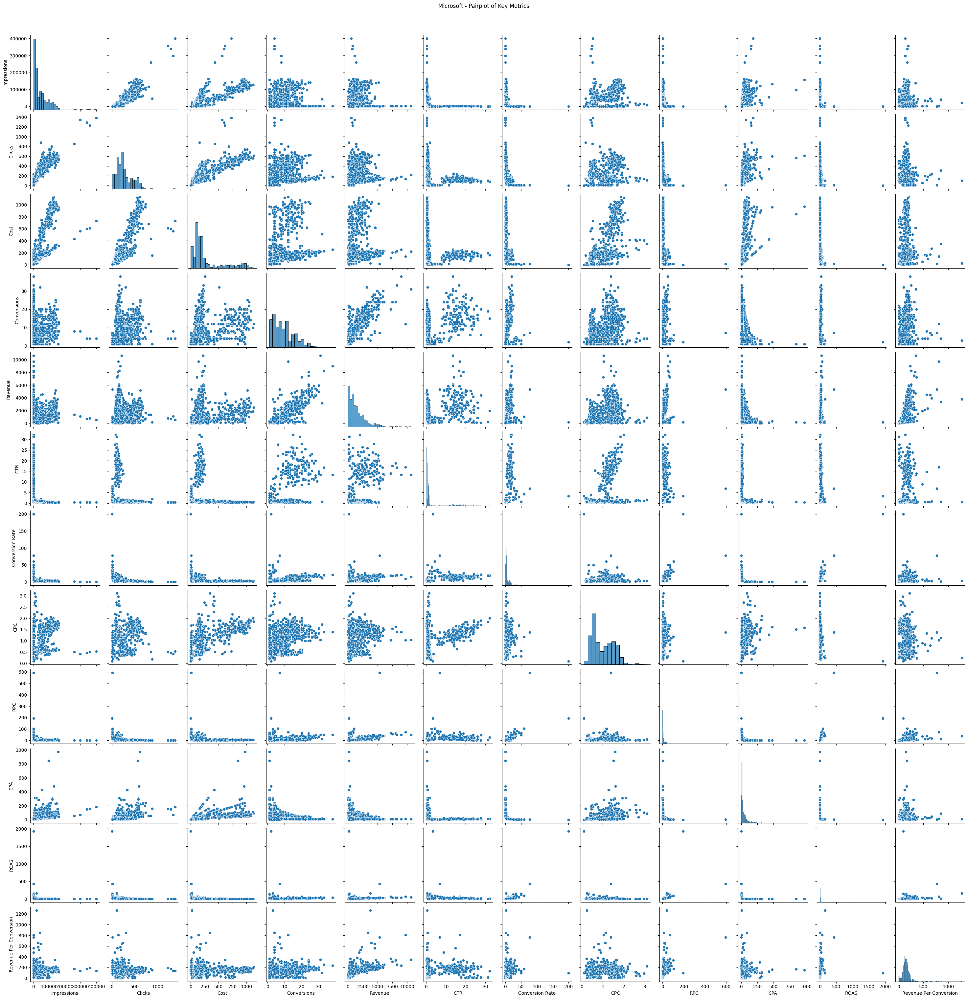

In [22]:
advanced_eda(df1, 'Google')
advanced_eda(df2, 'Meta')
advanced_eda(df3, 'Microsoft')

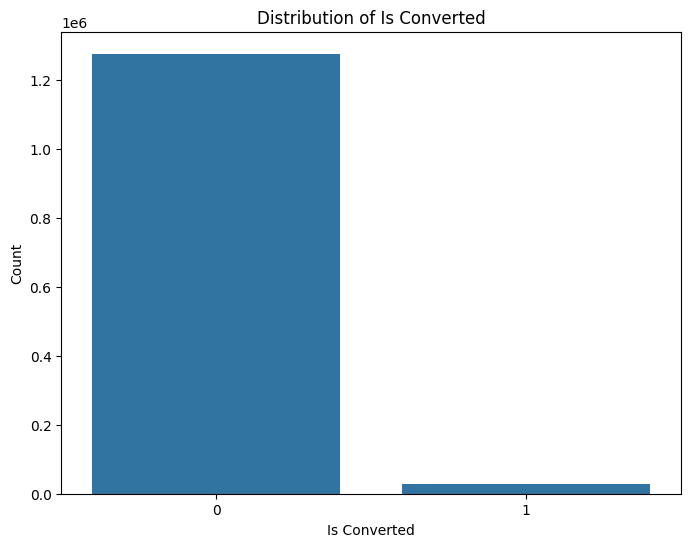

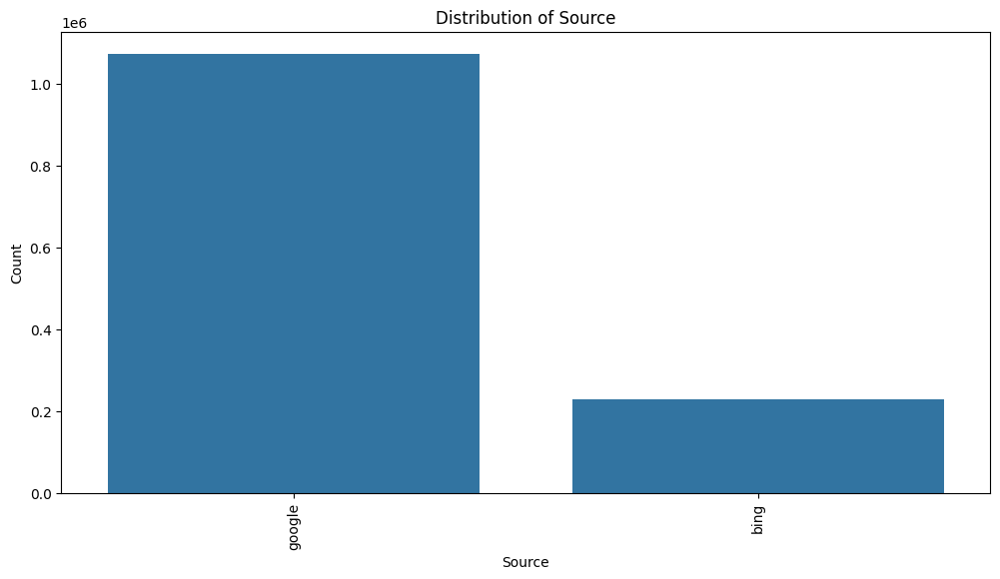

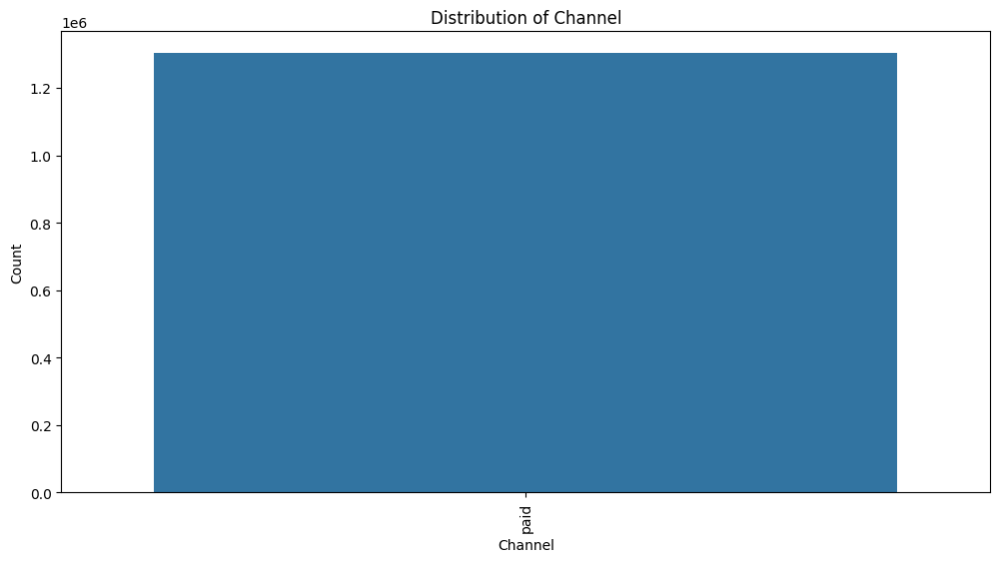

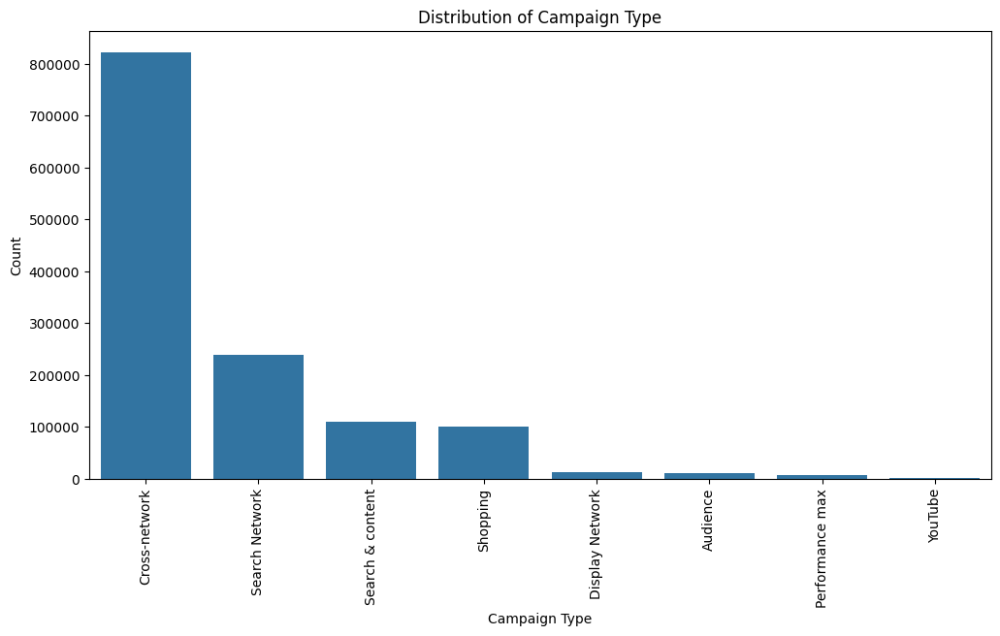

In [23]:
plt.figure(figsize=(8, 6))
sns.countplot(x='Is Converted', data=df4)
plt.title('Distribution of Is Converted')
plt.xlabel('Is Converted')
plt.ylabel('Count')
plt.show()

plt.figure(figsize=(12, 6))
sns.countplot(x='Source', data=df4, order=df4['Source'].value_counts().index)
plt.title('Distribution of Source')
plt.xlabel('Source')
plt.ylabel('Count')
plt.xticks(rotation=90)
plt.show()

plt.figure(figsize=(12, 6))
sns.countplot(x='Channel', data=df4, order=df4['Channel'].value_counts().index)
plt.title('Distribution of Channel')
plt.xlabel('Channel')
plt.ylabel('Count')
plt.xticks(rotation=90)
plt.show()

plt.figure(figsize=(12, 6))
sns.countplot(x='Campaign Type', data=df4, order=df4['Campaign Type'].value_counts().index)
plt.title('Distribution of Campaign Type')
plt.xlabel('Campaign Type')
plt.ylabel('Count')
plt.xticks(rotation=90)
plt.show()


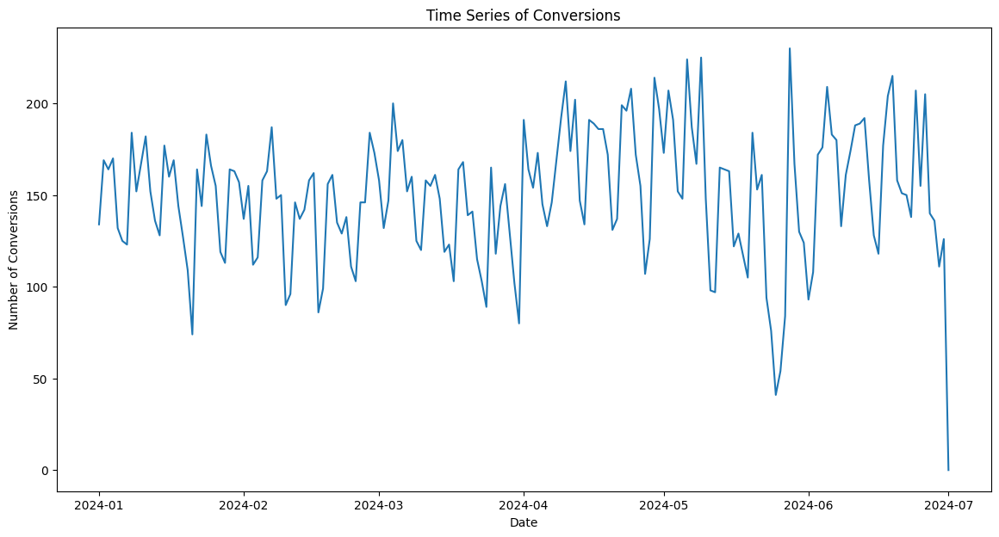

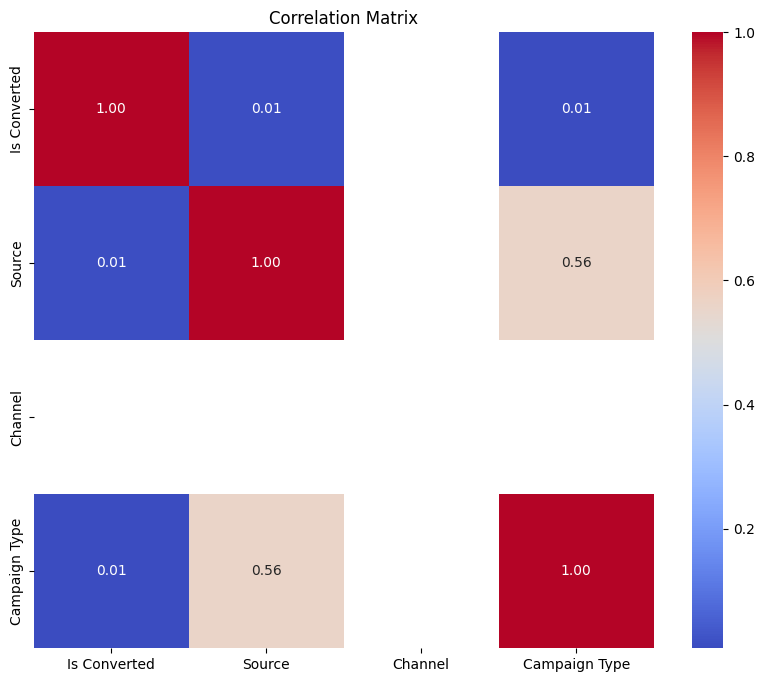

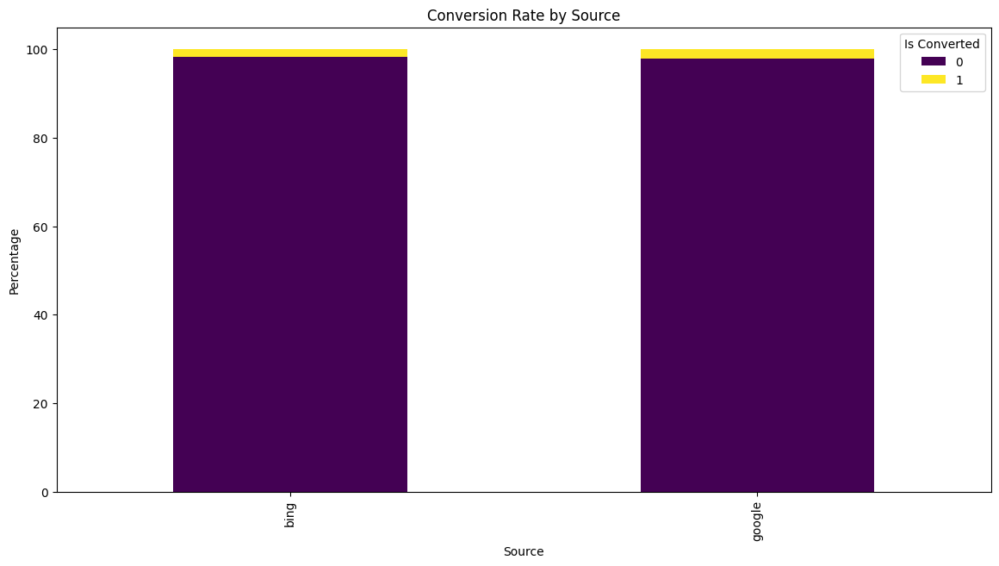

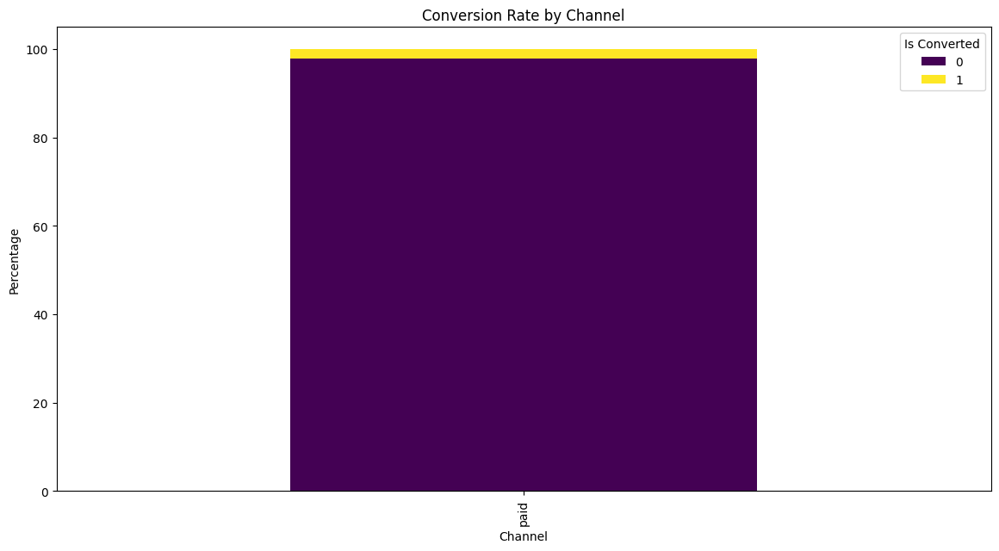

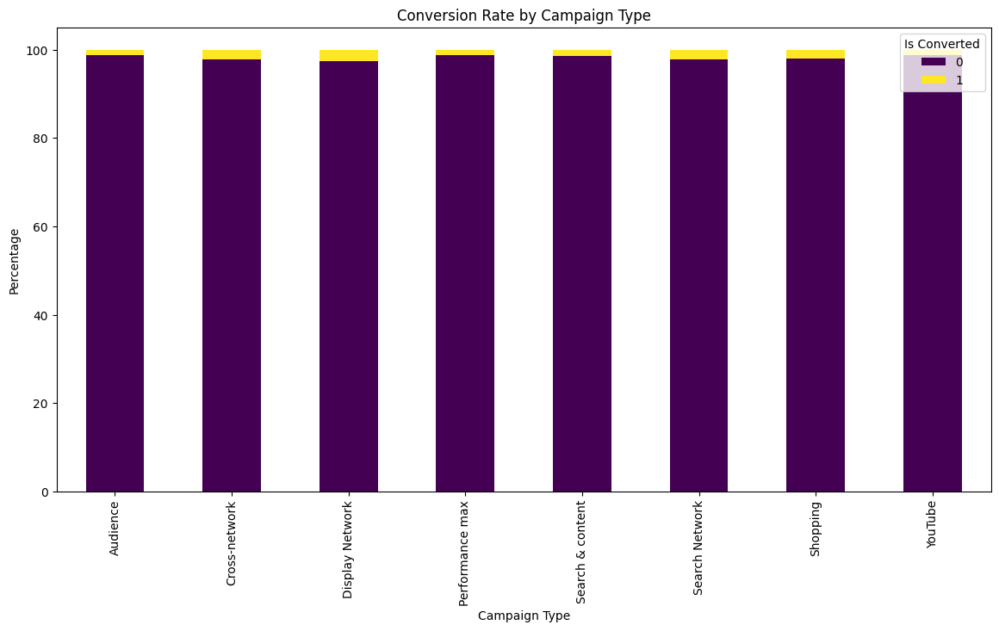

In [24]:

df4['Date'] = df4['Website Landing Time'].dt.date
converted_timeseries = df4.groupby('Date')['Is Converted'].sum()

plt.figure(figsize=(14, 7))
converted_timeseries.plot()
plt.title('Time Series of Conversions')
plt.xlabel('Date')
plt.ylabel('Number of Conversions')
plt.show()
corr_matrix = df4[['Is Converted', 'Source', 'Channel', 'Campaign Type']].apply(lambda x: pd.factorize(x)[0]).corr()
plt.figure(figsize=(10, 8))
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', fmt='.2f')
plt.title('Correlation Matrix')
plt.show()
source_conversion = pd.crosstab(df4['Source'], df4['Is Converted'], normalize='index') * 100
source_conversion.plot(kind='bar', stacked=True, figsize=(14, 7), colormap='viridis')
plt.title('Conversion Rate by Source')
plt.xlabel('Source')
plt.ylabel('Percentage')
plt.legend(title='Is Converted', loc='upper right')
plt.show()
channel_conversion = pd.crosstab(df4['Channel'], df4['Is Converted'], normalize='index') * 100
channel_conversion.plot(kind='bar', stacked=True, figsize=(14, 7), colormap='viridis')
plt.title('Conversion Rate by Channel')
plt.xlabel('Channel')
plt.ylabel('Percentage')
plt.legend(title='Is Converted', loc='upper right')
plt.show()
campaign_conversion = pd.crosstab(df4['Campaign Type'], df4['Is Converted'], normalize='index') * 100
campaign_conversion.plot(kind='bar', stacked=True, figsize=(14, 7), colormap='viridis')
plt.title('Conversion Rate by Campaign Type')
plt.xlabel('Campaign Type')
plt.ylabel('Percentage')
plt.legend(title='Is Converted', loc='upper right')
plt.show()

In [25]:
def summarize_performance(df, channel_name):
    performance_summary = {
        'Channel': channel_name,
        'Total Impressions': df['Impressions'].sum(),
        'Total Clicks': df['Clicks'].sum(),
        'Total Conversions': df['Conversions'].sum(),
        'Total Cost': df['Cost'].sum(),
        'Total Revenue': df['Revenue'].sum(),
        'CTR': (df['Clicks'].sum() / df['Impressions'].sum()) * 100,
        'Conversion Rate': (df['Conversions'].sum() / df['Clicks'].sum()) * 100,
        'CPC': (df['Cost'].sum() / df['Clicks'].sum()),
        'CPA': (df['Cost'].sum() / df['Conversions'].sum()),
        'ROAS': (df['Revenue'].sum() / df['Cost'].sum())
    }
    return pd.DataFrame([performance_summary])


In [26]:
google_performance = summarize_performance(df1, 'Google Ads')
meta_performance = summarize_performance(df2, 'Meta Ads')
microsoft_performance = summarize_performance(df3, 'Microsoft Ads')
cross_channel_performance = pd.concat([google_performance, meta_performance, microsoft_performance], ignore_index=True)
cross_channel_performance


,Channel,Total Impressions,Total Clicks,Total Conversions,Total Cost,Total Revenue,CTR,Conversion Rate,CPC,CPA,ROAS
0,Google Ads,109450420,1079042,49692.2,1334208.6,8642485.1,0.985873,4.605215,1.236475,26.849457,6.477612
1,Meta Ads,5934382,111580,5635.0,37812.4,1026382.3,1.880229,5.050188,0.338882,6.710275,27.144066
2,Microsoft Ads,34274896,217250,7746.0,230061.0,1216226.6,0.633846,3.565478,1.058969,29.700620,5.286540


In [27]:

cross_channel_performance['ROI'] = cross_channel_performance['ROAS'] - 1

best_channel = cross_channel_performance.loc[cross_channel_performance['ROI'].idxmax()]
print(f"The best performing channel in terms of ROI is {best_channel['Channel']} with an ROI of {best_channel['ROI']:.2f}.")


The best performing channel in terms of ROI is Meta Ads with an ROI of 26.14.


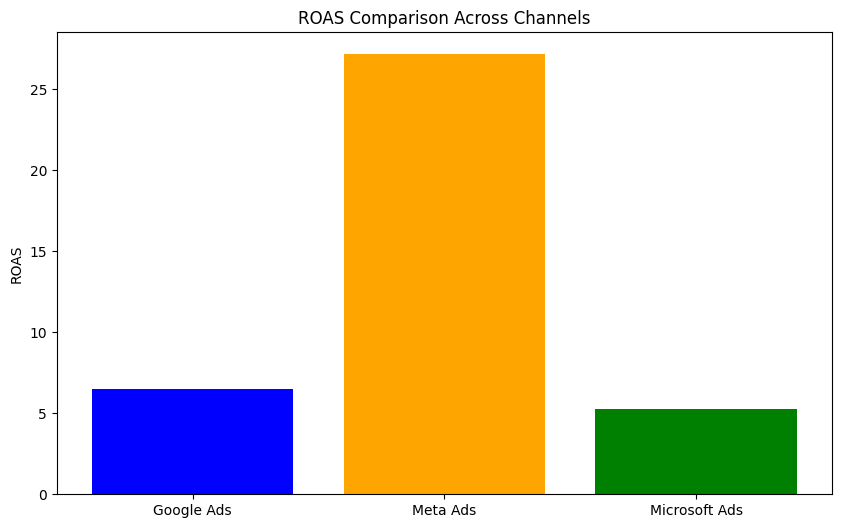

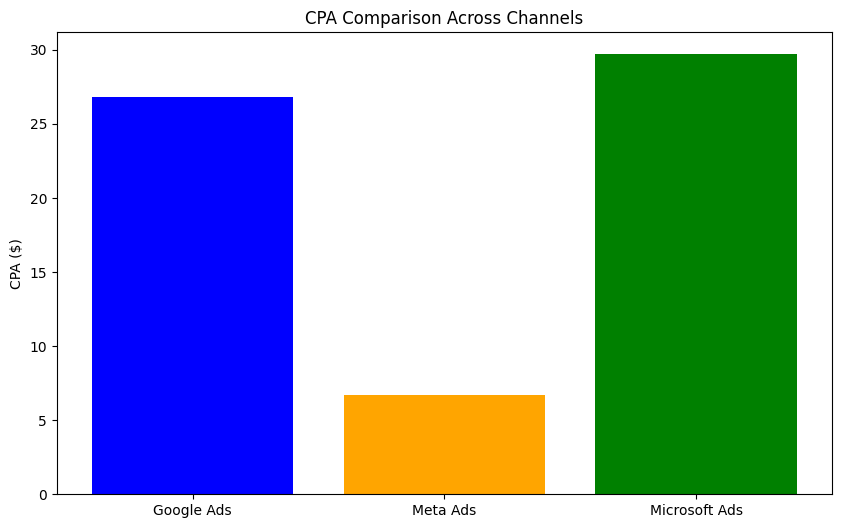

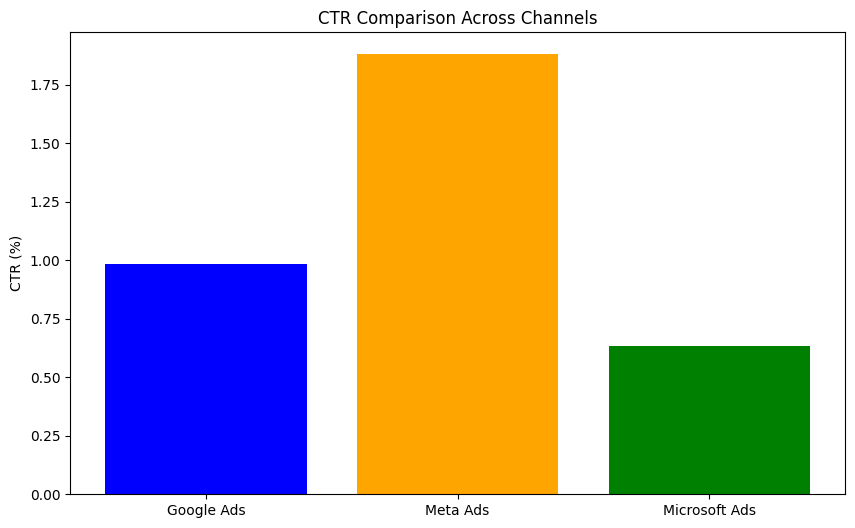

In [28]:
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 6))
plt.bar(cross_channel_performance['Channel'], cross_channel_performance['ROAS'], color=['blue', 'orange', 'green'])
plt.title('ROAS Comparison Across Channels')
plt.ylabel('ROAS')
plt.show()

plt.figure(figsize=(10, 6))
plt.bar(cross_channel_performance['Channel'], cross_channel_performance['CPA'], color=['blue', 'orange', 'green'])
plt.title('CPA Comparison Across Channels')
plt.ylabel('CPA ($)')
plt.show()

plt.figure(figsize=(10, 6))
plt.bar(cross_channel_performance['Channel'], cross_channel_performance['CTR'], color=['blue', 'orange', 'green'])
plt.title('CTR Comparison Across Channels')
plt.ylabel('CTR (%)')
plt.show()


In [29]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor, AdaBoostRegressor
from sklearn.linear_model import LinearRegression, Ridge, Lasso
from sklearn.tree import DecisionTreeRegressor
from sklearn.svm import SVR
from xgboost import XGBRegressor
from sklearn.metrics import mean_squared_error,r2_score
import numpy as np

In [35]:
from sklearn.preprocessing import LabelEncoder

le = LabelEncoder()

df1_encoded = df1.apply(lambda col: le.fit_transform(col) if col.dtype == 'object' else col)
df2_encoded = df2.apply(lambda col: le.fit_transform(col) if col.dtype == 'object' else col)
df3_encoded = df3.apply(lambda col: le.fit_transform(col) if col.dtype == 'object' else col)

In [36]:
def placeholder_function():
    pass


In [37]:
def load_data():
    df1_encoded['Channel'] = 'Google'
    df2_encoded['Channel'] = 'Meta'
    df3_encoded['Channel'] = 'Microsoft'

    print(f"Shape of df1_encoded: {df1_encoded.shape}")
    print(f"Shape of df2_encoded: {df2_encoded.shape}")
    print(f"Shape of df3_encoded: {df3_encoded.shape}")

    df_combined = pd.concat([df1_encoded, df2_encoded, df3_encoded], ignore_index=True)
    print(f"Shape after concatenation: {df_combined.shape}")

    df_combined.dropna(subset=['Impressions', 'Clicks', 'Conversions', 'Cost', 'Revenue'], inplace=True)
    print(f"Shape after dropna: {df_combined.shape}")

    if df_combined.empty:
        raise ValueError("Combined dataframe is empty after loading and preprocessing.")

    return df_combined



In [38]:
def train_models(df):
    X = df[['CTR', 'Conversion Rate', 'CPC', 'CPA', 'Impressions', 'Clicks', 'Conversions']]
    y = df['Revenue']

    print(f"Shape of X: {X.shape}, Shape of y: {y.shape}")

    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

    if X_train.empty or X_test.empty:
        raise ValueError("Train or test set is empty after splitting. Please check the data or split parameters.")

    models = {
        'RandomForest': RandomForestRegressor(),
        'GradientBoosting': GradientBoostingRegressor(),
        'XGBoost': XGBRegressor(),
        'LinearRegression': LinearRegression(),
        'Ridge': Ridge(),
        'Lasso': Lasso(),
        'DecisionTree': DecisionTreeRegressor(),
        'SVR': SVR(),
        'AdaBoost': AdaBoostRegressor()
    }

    model_performance = {}

    for name, model in models.items():
        model.fit(X_train, y_train)
        y_pred = model.predict(X_test)

        mse = mean_squared_error(y_test, y_pred)
        r2 = r2_score(y_test, y_pred)

        model_performance[name] = {'MSE': mse, 'R2 Score': r2}

        print(f"{name} Model MSE: {mse:.2f}, R2 Score: {r2:.2f}")

    mse_values = np.array([model_performance[name]['MSE'] for name in models])
    r2_values = np.array([model_performance[name]['R2 Score'] for name in models])

    normalized_mse = (mse_values - mse_values.min()) / (mse_values.max() - mse_values.min())
    normalized_r2 = (r2_values - r2_values.min()) / (r2_values.max() - r2_values.min())

    combined_score = normalized_mse - normalized_r2

    best_model_name = list(models.keys())[np.argmin(combined_score)]
    print(f"Best Model: {best_model_name}")

    best_model = models[best_model_name]
    best_model.fit(X, y)

    return best_model

In [39]:
def allocate_budget(df, model, total_budget=200000):
    if 'Channel' not in df.columns:
        raise KeyError("'Channel' column not found in the DataFrame")

    df['Predicted Revenue'] = model.predict(df[['CTR', 'Conversion Rate', 'CPC', 'CPA', 'Impressions', 'Clicks', 'Conversions']])
    df['Revenue Share'] = df['Predicted Revenue'] / df['Predicted Revenue'].sum()

    min_allocation = 0.1 * total_budget
    df['Allocated Budget'] = df['Revenue Share'] * total_budget
    df['Allocated Budget'] = np.where(df['Allocated Budget'] < min_allocation, min_allocation, df['Allocated Budget'])

    df['Adjusted Budget'] = df['Allocated Budget'] * (total_budget / df['Allocated Budget'].sum())

    print("Columns in DataFrame before returning allocation:")
    print(df.columns)

    if 'Channel' not in df.columns:
        raise KeyError("The 'Channel' column is missing after budget allocation processing")
    if 'Allocated Budget' not in df.columns or 'Adjusted Budget' not in df.columns or 'Predicted Revenue' not in df.columns:
        raise KeyError("One of the required columns ('Allocated Budget', 'Adjusted Budget', 'Predicted Revenue') is missing")

    return df[['Channel', 'Allocated Budget', 'Adjusted Budget', 'Predicted Revenue']]



In [40]:

def main():
    df_combined = load_data()

    placeholder_function()

    best_model = train_models(df_combined)
    budget_allocation = allocate_budget(df_combined, best_model)

    print(budget_allocation)

if __name__ == "__main__":
    main()


Shape of df1_encoded: (842, 15)
Shape of df2_encoded: (340, 17)
Shape of df3_encoded: (811, 15)
Shape after concatenation: (1993, 18)
Shape after dropna: (1993, 18)
Shape of X: (1993, 7), Shape of y: (1993,)
RandomForest Model MSE: 3336036.38, R2 Score: 0.91
GradientBoosting Model MSE: 3217517.67, R2 Score: 0.91
XGBoost Model MSE: 3532068.67, R2 Score: 0.90
LinearRegression Model MSE: 6063605.52, R2 Score: 0.83
Ridge Model MSE: 6063371.88, R2 Score: 0.83
Lasso Model MSE: 6060971.01, R2 Score: 0.83
DecisionTree Model MSE: 5020144.20, R2 Score: 0.86
SVR Model MSE: 45528276.52, R2 Score: -0.25
AdaBoost Model MSE: 5458902.30, R2 Score: 0.85
Best Model: GradientBoosting
Columns in DataFrame before returning allocation:
Index(['Date', 'Campaign type', 'Impressions', 'Clicks', 'Cost', 'Conversions',
       'Revenue', 'CTR', 'Conversion Rate', 'CPC', 'RPC', 'CPA', 'ROAS',
       'Revenue Per Conversion', 'Channel', 'Reach', 'Impressions Per Reach',
       'Clicks Per Reach', 'Predicted Revenue

Shape of df1_encoded: (842, 15)
Shape of df2_encoded: (340, 17)
Shape of df3_encoded: (811, 15)
Shape after concatenation: (1993, 18)
Shape after dropna: (1993, 18)
Shape of X: (1993, 7), Shape of y: (1993,)
RandomForest Model MSE: 3360275.92, R2 Score: 0.91
GradientBoosting Model MSE: 3226678.12, R2 Score: 0.91
XGBoost Model MSE: 3532068.67, R2 Score: 0.90
LinearRegression Model MSE: 6063605.52, R2 Score: 0.83
Ridge Model MSE: 6063371.88, R2 Score: 0.83
Lasso Model MSE: 6060971.01, R2 Score: 0.83
DecisionTree Model MSE: 4915618.01, R2 Score: 0.87
SVR Model MSE: 45528276.52, R2 Score: -0.25
AdaBoost Model MSE: 6041047.25, R2 Score: 0.83
Best Model: GradientBoosting
Columns in DataFrame before returning allocation:
Index(['Date', 'Campaign type', 'Impressions', 'Clicks', 'Cost', 'Conversions',
       'Revenue', 'CTR', 'Conversion Rate', 'CPC', 'RPC', 'CPA', 'ROAS',
       'Revenue Per Conversion', 'Channel', 'Reach', 'Impressions Per Reach',
       'Clicks Per Reach', 'Predicted Revenue

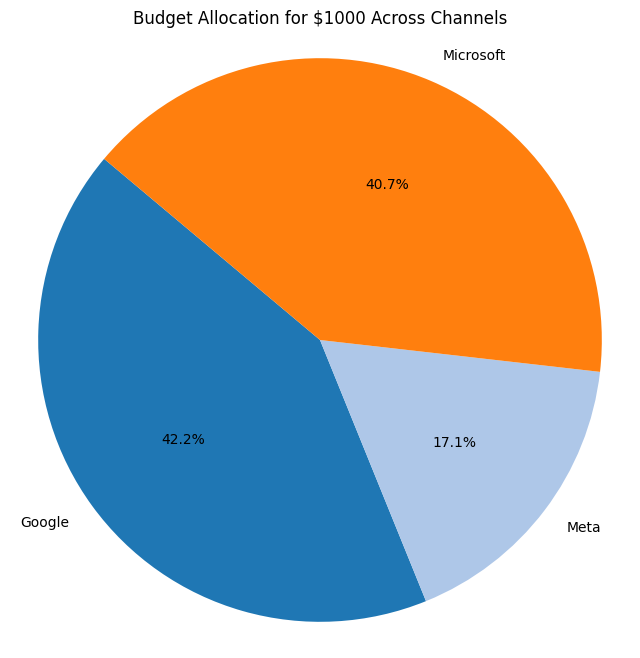

In [41]:
import matplotlib.pyplot as plt

def present_results(budget_allocation, total_budget=200000):
    aggregated_budget = budget_allocation.groupby('Channel').sum().reset_index()

    example_budget = 1000
    aggregated_budget['Example Budget Allocation'] = aggregated_budget['Adjusted Budget'] * (example_budget / total_budget)

    print(f"Example Output for an Input Budget of {example_budget} USD:")
    print(aggregated_budget[['Channel', 'Example Budget Allocation', 'Predicted Revenue']])

    plt.figure(figsize=(8, 8))
    plt.pie(
        aggregated_budget['Example Budget Allocation'],
        labels=aggregated_budget['Channel'],
        autopct='%1.1f%%',
        colors=plt.get_cmap('tab20').colors,
        startangle=140
    )
    plt.title(f'Budget Allocation for ${example_budget} Across Channels')
    plt.axis('equal')
    plt.show()

def main():
    df_combined = load_data()

    placeholder_function()

    best_model = train_models(df_combined)
    budget_allocation = allocate_budget(df_combined, best_model)

    present_results(budget_allocation)
if __name__ == "__main__":
    main()
